<a href="https://colab.research.google.com/github/ferhdz97/Challenge1_E4/blob/main/E4_FINAL_Exploracion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Preparación de Data

## Base

In [636]:
#Se importaron las librerias a utilizar para leer nuestra base de datos y para hacer plots como parte de nuestro análisis exploratorio.
import pandas as pd
import matplotlib.pyplot as plt

In [637]:
#Se subió el csv al Colab para poder leer los datos una vez que ya se instaló pandas.
path = '/content/drive/MyDrive/challenge_1_2.csv'

In [638]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [639]:
#Se creó un data frame (df) leyendo la información de la base de datos con extensión csv
df = pd.read_csv(path,skiprows = 1,encoding= 'unicode_escape')
df.head()

,CustomerId,Movilidad,Centro Nocturno,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Cultural,Centro Recreativo,NSE D,...,mar-20.1,abr-20.1,may-20.1,jun-20.1,jul-20.1,ago-20.1,sep-20.1,oct-20.1,nov-20.1,dic-20.1
0,1,447.0,0.0,0.0,840.0,2.0,4.0,0.0,0.0,2425.0,...,228,33,0,0,0,0,0,0,0,0
1,2,316.0,0.0,0.0,2552.0,2.0,2.0,0.0,0.0,1229.0,...,79,176,70,62,65,54,60,51,76,48
2,3,454.0,0.0,0.0,1430.0,0.0,0.0,0.0,0.0,1055.0,...,47,30,36,46,54,58,32,43,42,12
3,4,354.0,0.0,0.0,2145.0,0.0,0.0,0.0,0.0,1549.0,...,120,134,91,93,75,96,76,82,77,57
4,5,565.0,0.0,0.0,437.0,3.0,0.0,0.0,0.0,740.0,...,31,0,15,87,54,60,67,38,51,49


In [640]:
#Se corrió shape() para saber cuántas filas y columnas tiene la base de datos.
df.shape

(46707, 38)

## Selección de Columnas

In [641]:
# Variables de Entorno
df1 = ['CustomerId', 'Movilidad', 'Centro Nocturno', 'NSE AB', 'C+', 'Servicios públicos y comercio al por mayor', 
           'Comercio por menor', 'Centro Cultural', 'Centro Recreativo', 'NSE D', 'NSE E', '0 - 17 hombres',
           '0 -17 mujeres', 'VinosYLicores']
dfEnt = df[df1]
# Borramos Agua Purificada Individual porque no es requisito
# Colar Regular Familiar No Retornable
df3 = ['CustomerId', 'ene-20.1', 'feb_20.1', 'mar-20.1', 'abr-20.1', 'may-20.1', 'jun-20.1', 'jul-20.1',
            'ago-20.1', 'sep-20.1', 'oct-20.1', 'nov-20.1', 'dic-20.1']
dfCol = df[df3]

In [642]:
# Variables de Entorno
dfs = ['CustomerId', 'Movilidad', 'Centro Nocturno', 'NSE AB', 'C+', 'Servicios públicos y comercio al por mayor', 
           'Comercio por menor', 'Centro Cultural', 'Centro Recreativo', 'NSE D', 'NSE E', '0 - 17 hombres',
           '0 -17 mujeres', 'VinosYLicores', 'ene-20.1', 'feb_20.1', 'mar-20.1', 'abr-20.1', 'may-20.1', 'jun-20.1', 
           'jul-20.1', 'ago-20.1', 'sep-20.1', 'oct-20.1', 'nov-20.1', 'dic-20.1']
dfec = df[dfs]

dfec

,CustomerId,Movilidad,Centro Nocturno,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Cultural,Centro Recreativo,NSE D,...,mar-20.1,abr-20.1,may-20.1,jun-20.1,jul-20.1,ago-20.1,sep-20.1,oct-20.1,nov-20.1,dic-20.1
0,1,447.0,0.0,0.0,840.0,2.0,4.0,0.0,0.0,2425.0,...,228,33,0,0,0,0,0,0,0,0
1,2,316.0,0.0,0.0,2552.0,2.0,2.0,0.0,0.0,1229.0,...,79,176,70,62,65,54,60,51,76,48
2,3,454.0,0.0,0.0,1430.0,0.0,0.0,0.0,0.0,1055.0,...,47,30,36,46,54,58,32,43,42,12
3,4,354.0,0.0,0.0,2145.0,0.0,0.0,0.0,0.0,1549.0,...,120,134,91,93,75,96,76,82,77,57
4,5,565.0,0.0,0.0,437.0,3.0,0.0,0.0,0.0,740.0,...,31,0,15,87,54,60,67,38,51,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46702,46703,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6908.0,...,0,0,0,0,0,0,0,0,0,0
46703,46704,NaN,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1911.0,...,0,0,0,0,0,0,0,0,0,0
46704,46705,NaN,0.0,320.0,54.0,3.0,0.0,0.0,0.0,1411.0,...,0,0,0,0,0,0,0,0,0,0
46705,46706,NaN,0.0,85.0,298.0,6.0,0.0,0.0,0.0,360.0,...,0,0,0,0,0,0,0,0,0,0


## Sumatoria de Ventas Mensuales

In [643]:
#Se definió una función que sume las ventas por mes de la base de datos.
dfec['Colar_sum'] = (dfec['ene-20.1'] + dfec['feb_20.1'] + dfec['mar-20.1'] + dfec['abr-20.1'] + dfec['may-20.1'] + dfec['jun-20.1'] + dfec['jul-20.1'] + dfec['ago-20.1'] + dfec['sep-20.1'] + dfec['oct-20.1'] + dfec['nov-20.1'] + dfec['dic-20.1'])

<ipython-input-643-b384cd0f22ed>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [644]:
#Se corrió la función creada para ver los resultados.
dfec['Colar_sum']

0         802
1         883
2         448
3        1104
4         580
         ... 
46702       0
46703       0
46704       0
46705       0
46706       0
Name: Colar_sum, Length: 46707, dtype: int64

In [645]:
#Se creó una variable para contar qué valores de las ventas tienen 0.
z_count = (dfec['Colar_sum'] == 0).sum()
print(z_count)

14493


## Eliminación de Columnas

Sólo nos quedaremos con las ventas sumadas de los meses del año 2020.

In [646]:
#Aquí se utilizó la función drop con la función que se había creado previamente para quitar las ventas por mes, sólo nos quedamos con la sumatoria.
dfec = dfec.drop(['CustomerId', 'ene-20.1', 'feb_20.1', 'mar-20.1', 'abr-20.1', 'may-20.1', 'jun-20.1', 'jul-20.1', 'ago-20.1', 'sep-20.1', 'oct-20.1', 'nov-20.1', 'dic-20.1'], axis = 1)
dfec

,Movilidad,Centro Nocturno,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Cultural,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,VinosYLicores,Colar_sum
0,447.0,0.0,0.0,840.0,2.0,4.0,0.0,0.0,2425.0,603.0,1322.0,1283.0,1.0,802
1,316.0,0.0,0.0,2552.0,2.0,2.0,0.0,0.0,1229.0,0.0,1861.0,1779.0,0.0,883
2,454.0,0.0,0.0,1430.0,0.0,0.0,0.0,0.0,1055.0,0.0,1378.0,1292.0,1.0,448
3,354.0,0.0,0.0,2145.0,0.0,0.0,0.0,0.0,1549.0,0.0,1391.0,1408.0,1.0,1104
4,565.0,0.0,0.0,437.0,3.0,0.0,0.0,0.0,740.0,0.0,1087.0,944.0,0.0,580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46702,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6908.0,803.0,1501.0,1464.0,NaN,0
46703,NaN,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1911.0,45.0,644.0,560.0,NaN,0
46704,NaN,0.0,320.0,54.0,3.0,0.0,0.0,0.0,1411.0,493.0,761.0,750.0,NaN,0
46705,NaN,0.0,85.0,298.0,6.0,0.0,0.0,0.0,360.0,0.0,286.0,263.0,NaN,0


#Gráficas exploratorias

Como parte del análisis exploratorio obutvimos scatter, histogramas y boxplots para ver la distribución de los datos previa a la limpieza.

En general las variables de movilidad y hombres tienen una distribución más amplia de los datos, sin embargo, las demás variables tiene los datos sesgados a la izquierda (0) en su mayoría.

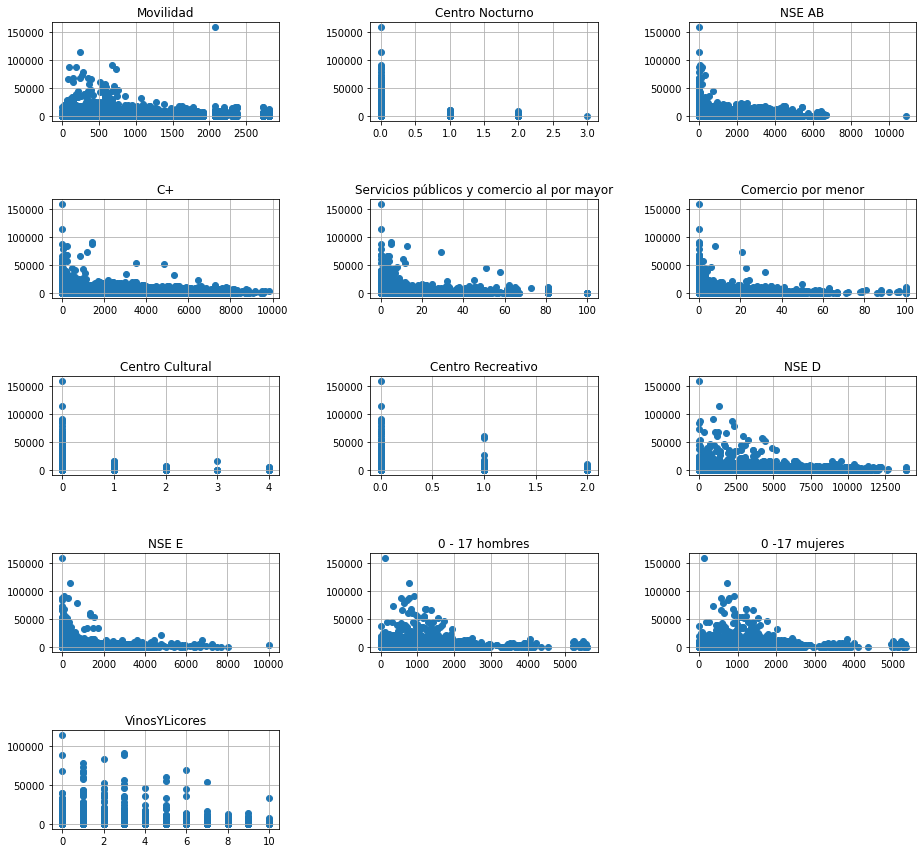

In [647]:
#Se corrieron scatter plots para ver la distribución de los datos de cada variable x.
plt.rcParams["figure.figsize"] = (15,14
) 

plt.subplot(5,3,1)
plt.scatter(dfec['Movilidad'], dfec['Colar_sum'])
plt.title("Movilidad")
plt.grid()

plt.subplot(5,3,2)
plt.scatter(dfec['Centro Nocturno'], dfec['Colar_sum'])
plt.title("Centro Nocturno")
plt.grid()

plt.subplot(5,3,3)
plt.scatter(dfec['NSE AB'], dfec['Colar_sum'])
plt.title("NSE AB")
plt.grid()

plt.subplot(5,3,4)
plt.scatter(dfec['C+'], dfec['Colar_sum'])
plt.title("C+")
plt.grid()

plt.subplot(5,3,5)
plt.scatter(dfec['Servicios públicos y comercio al por mayor'], dfec['Colar_sum'])
plt.title("Servicios públicos y comercio al por mayor")
plt.grid()

plt.subplot(5,3,6)
plt.scatter(dfec['Comercio por menor'], dfec['Colar_sum'])
plt.title("Comercio por menor")
plt.grid()

plt.subplot(5,3,7)
plt.scatter(dfec['Centro Cultural'], dfec['Colar_sum'])
plt.title("Centro Cultural")
plt.grid()

plt.subplot(5,3,8)
plt.scatter(dfec['Centro Recreativo'], dfec['Colar_sum'])
plt.title("Centro Recreativo")
plt.grid()

plt.subplot(5,3,9)
plt.scatter(dfec['NSE D'], dfec['Colar_sum'])
plt.title("NSE D")
plt.grid()

plt.subplot(5,3,10)
plt.scatter(dfec['NSE E'], dfec['Colar_sum'])
plt.title("NSE E")
plt.grid()

plt.subplot(5,3,11)
plt.scatter(dfec['0 - 17 hombres'], dfec['Colar_sum'])
plt.title("0 - 17 hombres")
plt.grid()

plt.subplot(5,3,12)
plt.scatter(dfec['0 -17 mujeres'], dfec['Colar_sum'])
plt.title("0 -17 mujeres")
plt.grid()

plt.subplot(5,3,13)
plt.scatter(dfec['VinosYLicores'], dfec['Colar_sum'])
plt.title("VinosYLicores")
plt.grid()

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.8)

In [648]:
#Usamos plotly para hacer las gráficas exploratorias, a excepción del scatter que se usó el código anterior.
import plotly.express as px

fig = px.histogram(dfec, x="Movilidad")
fig.show()

fig = px.histogram(dfec, x="Centro Nocturno")
fig.show()

fig = px.histogram(dfec, x="NSE AB")
fig.show()

fig = px.histogram(dfec, x="C+")
fig.show()

fig = px.histogram(dfec, x="Servicios públicos y comercio al por mayor")
fig.show()

fig = px.histogram(dfec, x="Comercio por menor")
fig.show()

fig = px.histogram(dfec, x="Centro Cultural")
fig.show()

fig = px.histogram(dfec, x="Centro Recreativo")
fig.show()

fig = px.histogram(dfec, x="NSE D")
fig.show()

fig = px.histogram(dfec, x="NSE E")
fig.show()

fig = px.histogram(dfec, x="0 - 17 hombres")
fig.show()

fig = px.histogram(dfec, x="0 -17 mujeres")
fig.show()

fig = px.histogram(dfec, x="VinosYLicores")
fig.show()

In [649]:
fig = px.box(dfec, x="Movilidad")
fig.show()

fig = px.box(dfec, x="Centro Nocturno")
fig.show()

fig = px.box(dfec, x="NSE AB")
fig.show()

fig = px.box(dfec, x="C+")
fig.show()

fig = px.box(dfec, x="Servicios públicos y comercio al por mayor")
fig.show()

fig = px.box(dfec, x="Comercio por menor")
fig.show()

fig = px.box(dfec, x="Centro Cultural")
fig.show()

fig = px.box(dfec, x="Centro Recreativo")
fig.show()

fig = px.box(dfec, x="NSE D")
fig.show()

fig = px.box(dfec, x="NSE E")
fig.show()

fig = px.box(dfec, x="0 - 17 hombres")
fig.show()

fig = px.box(dfec, x="0 -17 mujeres")
fig.show()

fig = px.box(dfec, x="VinosYLicores")
fig.show()

## Eliminación de ventas == 0

In [650]:
#Se contaron los 0's de las x's más la sumatoria de las ventas que ya había definido en Colar_sum.
z_count = (dfec == 0).sum()
#Se imrpimió el conteo.
print(z_count )

Movilidad                                         0
Centro Nocturno                               46230
NSE AB                                        29688
C+                                            16656
Servicios públicos y comercio al por mayor    20712
Comercio por menor                            34854
Centro Cultural                               46072
Centro Recreativo                             46149
NSE D                                          9960
NSE E                                         26991
0 - 17 hombres                                   12
0 -17 mujeres                                    13
VinosYLicores                                 19603
Colar_sum                                     14493
dtype: int64


In [651]:
#Se definió otra variable pero ahora para contar los NaNs.
nan_count = dfec.isna().sum()
#Se imprimió el resultado.
print(nan_count )

Movilidad                                     11997
Centro Nocturno                                   4
NSE AB                                           64
C+                                               64
Servicios públicos y comercio al por mayor       49
Comercio por menor                               49
Centro Cultural                                   4
Centro Recreativo                                 4
NSE D                                            64
NSE E                                            64
0 - 17 hombres                                   73
0 -17 mujeres                                    73
VinosYLicores                                  6818
Colar_sum                                         0
dtype: int64


In [652]:
#Se contaron nuevamente los datos después de haber eliminado NaNs y los 0s
dfec.shape

(46707, 14)

In [653]:
#Se utilizaron sólo las filas que tenían un valor superior a 0 en su columna Colar_sum.
dfec = dfec[dfec.Colar_sum > 0]
dfec.shape

(32214, 14)

In [654]:
#Se imprió las primeras 5 filas de la función creada con head() para ver que efectivamente ya no haya ceros.
dfec.head()

,Movilidad,Centro Nocturno,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Cultural,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,VinosYLicores,Colar_sum
0,447.0,0.0,0.0,840.0,2.0,4.0,0.0,0.0,2425.0,603.0,1322.0,1283.0,1.0,802
1,316.0,0.0,0.0,2552.0,2.0,2.0,0.0,0.0,1229.0,0.0,1861.0,1779.0,0.0,883
2,454.0,0.0,0.0,1430.0,0.0,0.0,0.0,0.0,1055.0,0.0,1378.0,1292.0,1.0,448
3,354.0,0.0,0.0,2145.0,0.0,0.0,0.0,0.0,1549.0,0.0,1391.0,1408.0,1.0,1104
4,565.0,0.0,0.0,437.0,3.0,0.0,0.0,0.0,740.0,0.0,1087.0,944.0,0.0,580


In [655]:
#Se contaron nuevamente los ceros, a diferencia del proceso anterior la cantidad disminuyó pero aún signifiativa en los datos.
z_count = (dfec == 0).sum()
#Se imprimió el conteo.
print(z_count )

Movilidad                                         0
Centro Nocturno                               31866
NSE AB                                        21216
C+                                            12127
Servicios públicos y comercio al por mayor    14408
Comercio por menor                            24588
Centro Cultural                               31753
Centro Recreativo                             31794
NSE D                                          6346
NSE E                                         18024
0 - 17 hombres                                   11
0 -17 mujeres                                    12
VinosYLicores                                 13610
Colar_sum                                         0
dtype: int64


In [656]:
#Se contaron nuevamente los NaNs para visualizar cómo se comportan los NaNs al quitar los ceros.
nan_count = dfec.isna().sum()
#Se imprimió el conteo.
print(nan_count )

Movilidad                                     4344
Centro Nocturno                                  0
NSE AB                                          44
C+                                              44
Servicios públicos y comercio al por mayor      31
Comercio por menor                              31
Centro Cultural                                  0
Centro Recreativo                                0
NSE D                                           44
NSE E                                           44
0 - 17 hombres                                  53
0 -17 mujeres                                   53
VinosYLicores                                 3778
Colar_sum                                        0
dtype: int64


## Normalización de Variables

Se trabajó una normalización estadística, es decir, se transformó la escala de distribución de las variables para poder hacer comparaciones eliminando efectos de influencias.

Esto como parte de nuestro proceso de limpieza de datos.

In [657]:
#Se instalaron las librerías necesarias para trabajar.
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [658]:
#Las variables Xs: 'Centro Nocturno', 'Centro Cultural', 'VinosYLicores' son valores categóricos y por eso no están en esta lista.
X = ['Movilidad', 'NSE AB', 'C+', 'Servicios públicos y comercio al por mayor', 
           'Comercio por menor', 'Centro Recreativo', 'NSE D', 'NSE E', '0 - 17 hombres',
           '0 -17 mujeres']

In [659]:
#La función scale se usó porque el dataset contiene features o variables de diferentes dimensiones y escalas.
#Estas variaciones afectan negativamente al modelado de un conjunto de datos.
scaler = MinMaxScaler() 
data_scaled = scaler.fit_transform(dfec[X])

In [660]:
#Nuevamente vemos cuántas filas y columnas tiene la base después de las "limpiezas" previas.
dfec.shape

(32214, 14)

In [661]:
#Se creó un data frame nuevo con los datos escalados.
new = pd.DataFrame(data_scaled)
#Se agregaron las columnas con las variables no categóricas.
new.columns = ['Movilidad', 'NSE AB', 'C+', 'Servicios públicos y comercio al por mayor', 
           'Comercio por menor', 'Centro Recreativo', 'NSE D', 'NSE E', '0 - 17 hombres',
           '0 -17 mujeres']
#Las variables categóricas las tomamos de la función creada con anterioridad.
new['Centro Nocturno'] = dfec['Centro Nocturno']
new['Centro Cultural'] = dfec['Centro Cultural']
new['VinosYLicores'] = dfec['VinosYLicores']
new['Colar_sum'] = dfec['Colar_sum']
#Se imprimió el nuevo dataset
dfec = new
dfec

,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Centro Nocturno,Centro Cultural,VinosYLicores,Colar_sum
0,0.158419,0.000000,0.085435,0.02,0.04,0.0,0.174913,0.060204,0.235525,0.240037,0.0,0.0,1.0,802.0
1,0.111784,0.000000,0.259561,0.02,0.02,0.0,0.088647,0.000000,0.331552,0.332834,0.0,0.0,0.0,883.0
2,0.160911,0.000000,0.145443,0.00,0.00,0.0,0.076096,0.000000,0.245502,0.241721,0.0,0.0,1.0,448.0
3,0.125311,0.000000,0.218165,0.00,0.00,0.0,0.111728,0.000000,0.247818,0.263424,0.0,0.0,1.0,1104.0
4,0.200427,0.000000,0.044447,0.03,0.00,0.0,0.053376,0.000000,0.193658,0.176614,0.0,0.0,0.0,580.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32209,0.163759,0.008013,0.007933,0.00,0.00,0.0,0.012767,0.000000,0.055407,0.058746,NaN,NaN,NaN,NaN
32210,NaN,0.000000,0.000000,0.00,0.00,0.0,0.028780,0.011382,0.016925,0.024696,NaN,NaN,NaN,NaN
32211,NaN,0.022472,0.211452,0.21,0.02,0.0,0.000000,0.000000,0.085338,0.085126,NaN,NaN,NaN,NaN
32212,0.081524,0.002026,0.059805,0.00,0.00,0.0,0.008439,0.003494,0.142526,0.138634,NaN,NaN,NaN,NaN


In [662]:
#Se obtuvo información estadística básica para analizar los datos en general, tanto las Xs como las Ys.
dfec.describe()

,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Centro Nocturno,Centro Cultural,VinosYLicores,Colar_sum
count,27870.000000,32170.000000,32170.000000,32183.000000,32183.000000,32214.000000,32170.000000,32170.000000,32161.000000,32161.000000,22250.000000,22250.000000,19636.000000,22250.000000
mean,0.162149,0.024623,0.076869,0.038312,0.015593,0.006814,0.101297,0.019547,0.160172,0.163837,0.012045,0.016809,1.195712,2746.857888
std,0.150673,0.065504,0.130329,0.091290,0.052900,0.060461,0.121029,0.046349,0.089930,0.092082,0.123395,0.152836,1.653463,3714.110979
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.070488,0.000000,0.000000,0.000000,0.000000,0.000000,0.006852,0.000000,0.092464,0.095042,0.000000,0.000000,0.000000,453.000000
50%,0.119616,0.000000,0.014036,0.020000,0.000000,0.000000,0.056477,0.000000,0.158382,0.162021,0.000000,0.000000,1.000000,1930.500000
75%,0.200427,0.008473,0.099573,0.040000,0.000000,0.000000,0.154501,0.020567,0.218956,0.224883,0.000000,0.000000,2.000000,3959.750000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,4.000000,10.000000,159516.000000


## Cambio de Data Type

In [663]:
#Convertimos las variables que son categóricas a categóricas (str) para que la regresión sea correcta este dataset nuevo.
dfec[['Centro Nocturno', 'Centro Cultural', 'VinosYLicores']] = dfec[['Centro Nocturno', 'Centro Cultural', 'VinosYLicores']].astype(str)

dfec

,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Centro Nocturno,Centro Cultural,VinosYLicores,Colar_sum
0,0.158419,0.000000,0.085435,0.02,0.04,0.0,0.174913,0.060204,0.235525,0.240037,0.0,0.0,1.0,802.0
1,0.111784,0.000000,0.259561,0.02,0.02,0.0,0.088647,0.000000,0.331552,0.332834,0.0,0.0,0.0,883.0
2,0.160911,0.000000,0.145443,0.00,0.00,0.0,0.076096,0.000000,0.245502,0.241721,0.0,0.0,1.0,448.0
3,0.125311,0.000000,0.218165,0.00,0.00,0.0,0.111728,0.000000,0.247818,0.263424,0.0,0.0,1.0,1104.0
4,0.200427,0.000000,0.044447,0.03,0.00,0.0,0.053376,0.000000,0.193658,0.176614,0.0,0.0,0.0,580.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32209,0.163759,0.008013,0.007933,0.00,0.00,0.0,0.012767,0.000000,0.055407,0.058746,nan,nan,nan,NaN
32210,NaN,0.000000,0.000000,0.00,0.00,0.0,0.028780,0.011382,0.016925,0.024696,nan,nan,nan,NaN
32211,NaN,0.022472,0.211452,0.21,0.02,0.0,0.000000,0.000000,0.085338,0.085126,nan,nan,nan,NaN
32212,0.081524,0.002026,0.059805,0.00,0.00,0.0,0.008439,0.003494,0.142526,0.138634,nan,nan,nan,NaN


In [664]:
#Se comprobó que efectivamente las variables Centro Nocturno, Centro Cultural y VinosYLicores sean categóricas antes de correr la regresión.
dfec.dtypes

Movilidad                                     float64
NSE AB                                        float64
C+                                            float64
Servicios públicos y comercio al por mayor    float64
Comercio por menor                            float64
Centro Recreativo                             float64
NSE D                                         float64
NSE E                                         float64
0 - 17 hombres                                float64
0 -17 mujeres                                 float64
Centro Nocturno                                object
Centro Cultural                                object
VinosYLicores                                  object
Colar_sum                                     float64
dtype: object

## Outliers

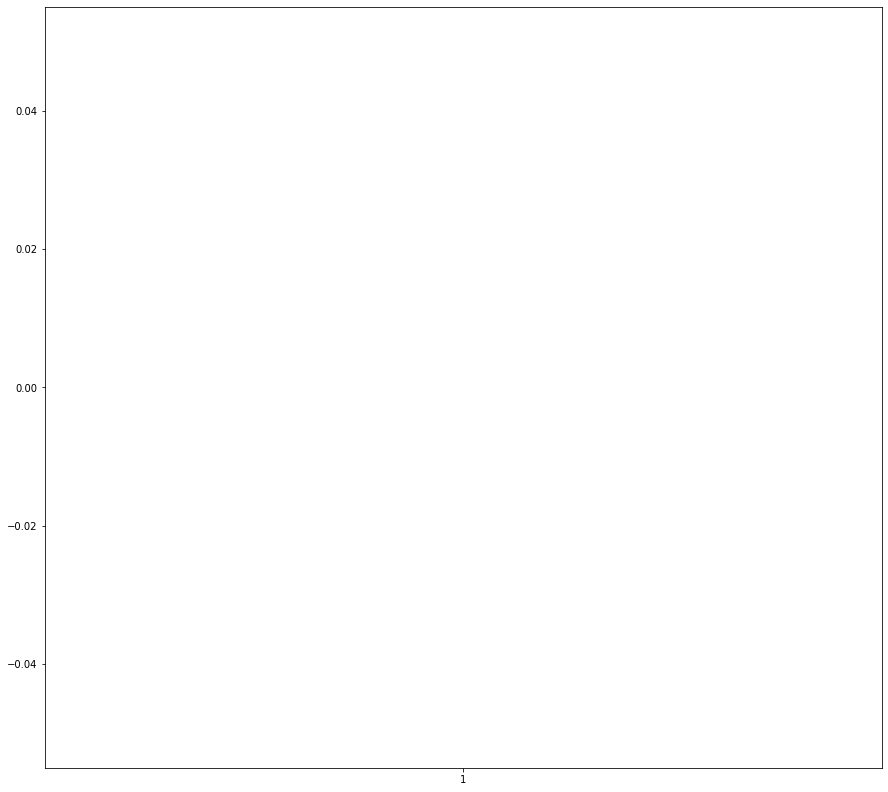

In [665]:
#Se corrió un boxplot de la suma de las ventas, sin embargo parece que los datos aún tienen datos atípicos para poder trabajar con ellos.
#Por eso borramos los outliers en las siguientes partes del código.
plt.boxplot(dfec['Colar_sum']);

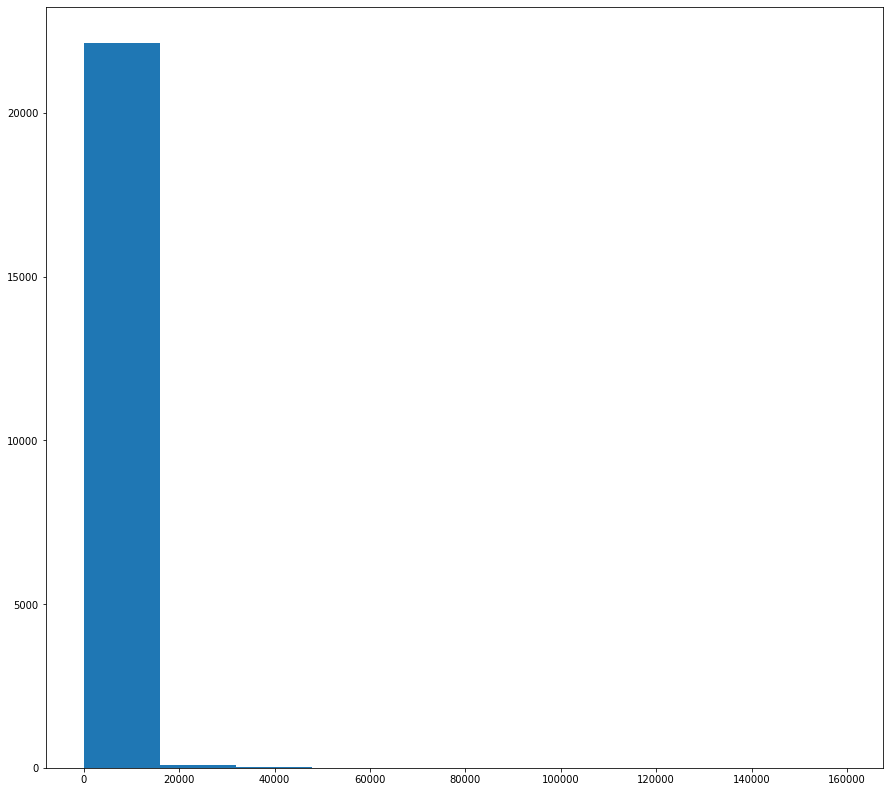

In [666]:
#Se corrió un histograma de la suma de las ventas.
plt.hist(dfec['Colar_sum']);

In [667]:
#In boxplot count
y = dfec['Colar_sum']
dfec[y.between(y.quantile(.15), y.quantile(.85))].count()

Movilidad                                     13404
NSE AB                                        15552
C+                                            15552
Servicios públicos y comercio al por mayor    15560
Comercio por menor                            15560
Centro Recreativo                             15578
NSE D                                         15552
NSE E                                         15552
0 - 17 hombres                                15549
0 -17 mujeres                                 15549
Centro Nocturno                               15578
Centro Cultural                               15578
VinosYLicores                                 15578
Colar_sum                                     15578
dtype: int64

In [668]:
#Se borraron los outliers, es decir la distancia anormal de otros datos en un muestra de datos.
y = dfec['Colar_sum']
dfec = dfec[y.between(y.quantile(.15), y.quantile(.85))]
dfec

,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Centro Nocturno,Centro Cultural,VinosYLicores,Colar_sum
0,0.158419,0.000000,0.085435,0.02,0.04,0.0,0.174913,0.060204,0.235525,0.240037,0.0,0.0,1.0,802.0
1,0.111784,0.000000,0.259561,0.02,0.02,0.0,0.088647,0.000000,0.331552,0.332834,0.0,0.0,0.0,883.0
2,0.160911,0.000000,0.145443,0.00,0.00,0.0,0.076096,0.000000,0.245502,0.241721,0.0,0.0,1.0,448.0
3,0.125311,0.000000,0.218165,0.00,0.00,0.0,0.111728,0.000000,0.247818,0.263424,0.0,0.0,1.0,1104.0
4,0.200427,0.000000,0.044447,0.03,0.00,0.0,0.053376,0.000000,0.193658,0.176614,0.0,0.0,0.0,580.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32142,0.620506,0.000000,0.000000,0.00,0.00,0.0,0.000000,0.222644,0.049172,0.050327,0.0,0.0,4.0,119.0
32143,NaN,0.328421,0.000000,0.00,0.00,0.0,0.007790,0.000000,0.122751,0.112067,0.0,0.0,3.0,426.0
32146,0.156639,0.000000,0.000000,0.03,0.03,0.0,0.167989,0.000000,0.278995,0.301216,0.0,0.0,2.0,277.0
32147,0.075116,0.000000,0.000000,0.00,0.00,0.0,0.083742,0.069389,0.069482,0.063798,0.0,0.0,0.0,86.0


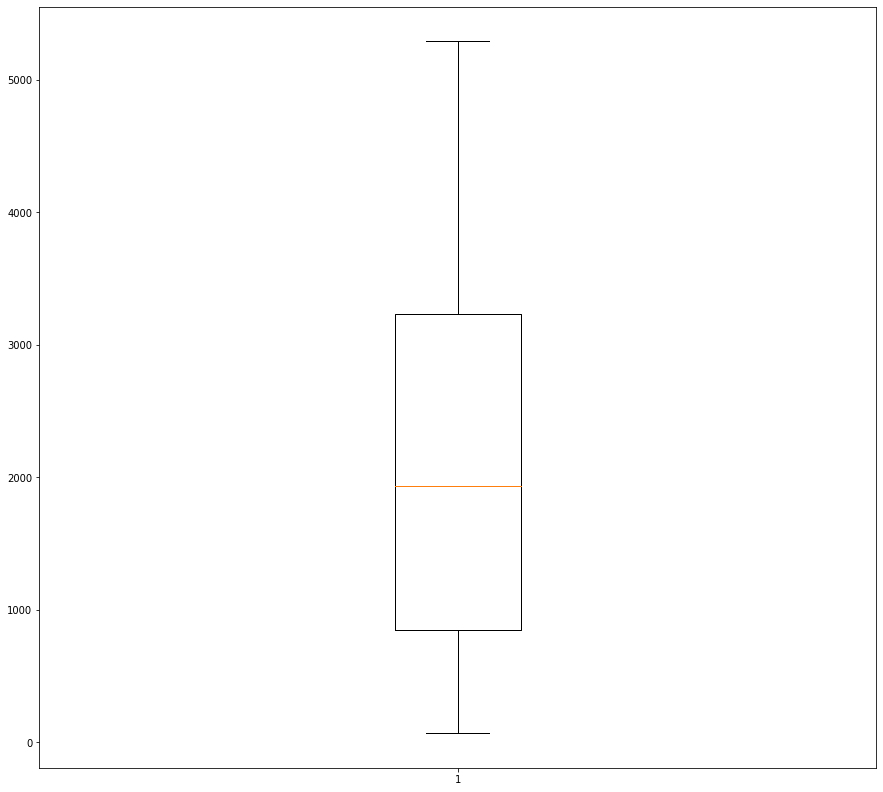

In [669]:
#Se hizo un boxplot y ahora sí tenemos valores después de quitar los outliers a diferencia del boxplot anterior.
plt.boxplot(dfec['Colar_sum']);

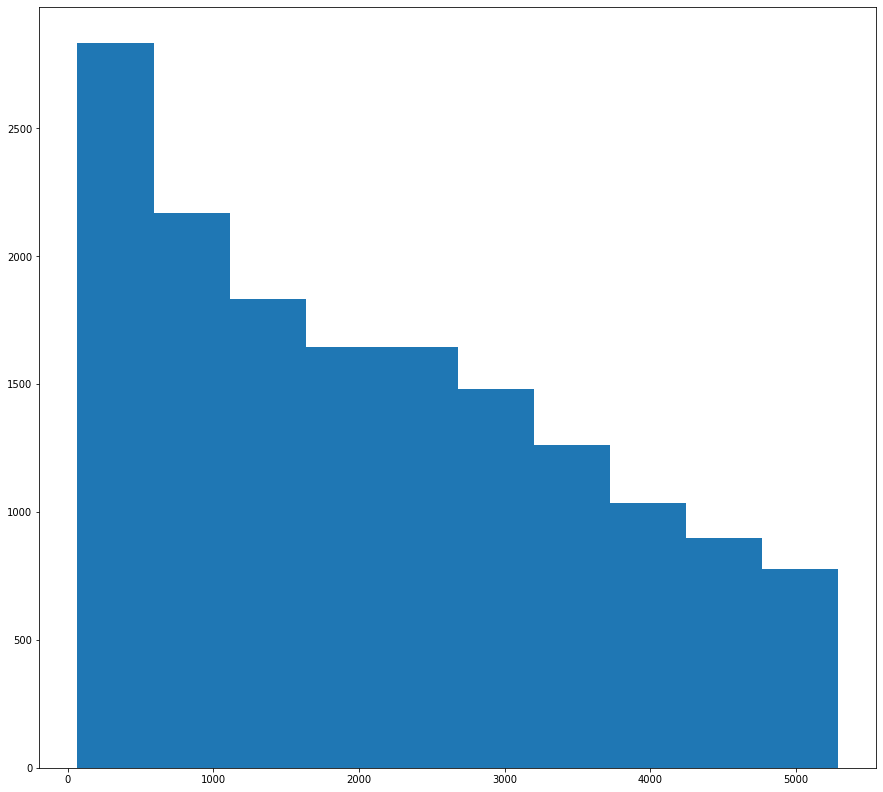

In [670]:
#Se corrió nuevamente un histograma y la distribución de los datos va de 0 a 500 a diferencia del anterior antes de quitar los outliers.
plt.hist(dfec['Colar_sum']);

## Eliminación de Valores NaN

In [671]:
#Nuevamente contamos los NaN's.
#Este ha sido un proceso repetitivo ya que se aplicaron diferentes métodos para limpiar los datos.
#Es por eso que después de cada limpieza hacemos una iteración a modo de comprobación.
nan_count = dfec.isna().sum()
print(nan_count)

Movilidad                                     2174
NSE AB                                          26
C+                                              26
Servicios públicos y comercio al por mayor      18
Comercio por menor                              18
Centro Recreativo                                0
NSE D                                           26
NSE E                                           26
0 - 17 hombres                                  29
0 -17 mujeres                                   29
Centro Nocturno                                  0
Centro Cultural                                  0
VinosYLicores                                    0
Colar_sum                                        0
dtype: int64


In [672]:
# dfec = dfec[df1].fillna(0) ~~ Se convirtieron los NaNs a cero.
dfec = dfec.dropna()

In [673]:
#Se contaron los NaN's después de eliminarlos en la última iteración.
nan_count = dfec.isna().sum()
print(nan_count)

#Efectivamente el resultado es 0.

Movilidad                                     0
NSE AB                                        0
C+                                            0
Servicios públicos y comercio al por mayor    0
Comercio por menor                            0
Centro Recreativo                             0
NSE D                                         0
NSE E                                         0
0 - 17 hombres                                0
0 -17 mujeres                                 0
Centro Nocturno                               0
Centro Cultural                               0
VinosYLicores                                 0
Colar_sum                                     0
dtype: int64


In [674]:
#Se identificaron los valores únicos en la columna de VinosYLicores para verificar que no haya NaNs o ceros.
dfec['VinosYLicores'].unique()

array(['1.0', '0.0', '2.0', 'nan', '3.0', '4.0', '6.0', '5.0', '8.0',
       '7.0', '9.0', '10.0'], dtype=object)

In [675]:
#Se agregó a la función para la columna de VinosYLicos que todos los NaNs y ceros sean reemplazados.
dfec['VinosYLicores'] = dfec['VinosYLicores'].replace('nan', '0.0')

<ipython-input-675-1f920732a78f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [676]:
#Se corrió la comprobación de la misma columna para ver que efectivamente se hayan borrados los NaNs y ceros.
dfec['VinosYLicores'].unique()

array(['1.0', '0.0', '2.0', '3.0', '4.0', '6.0', '5.0', '8.0', '7.0',
       '9.0', '10.0'], dtype=object)

## Correlaciones 

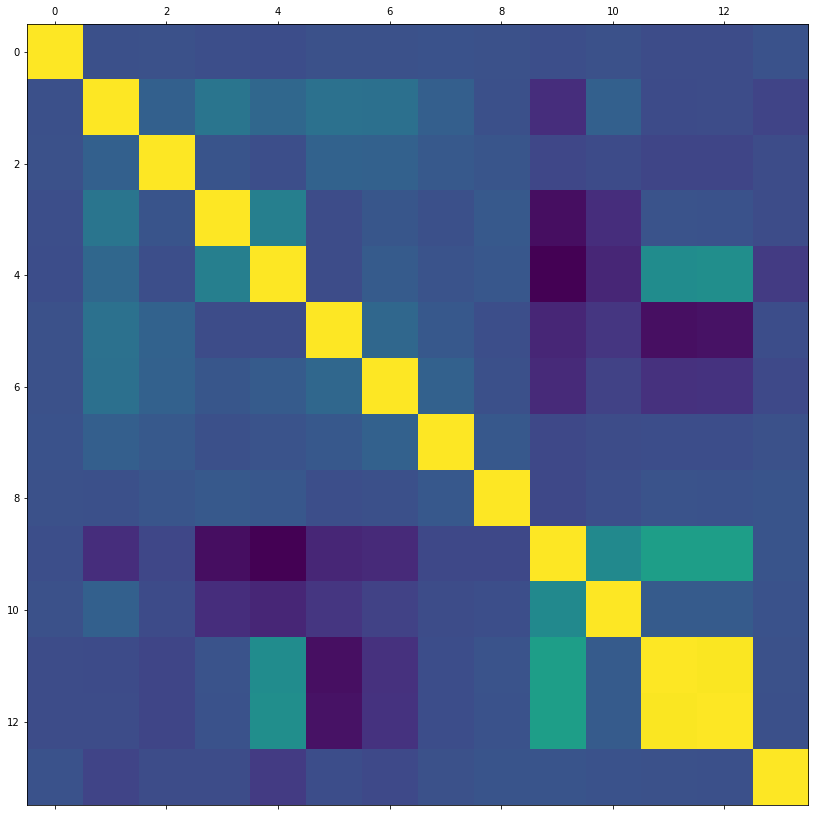

In [677]:
#Se imprimieron plots de las correlaciones de los datos ya "limpios".
plt.matshow(dfEnt.corr())
plt.show()

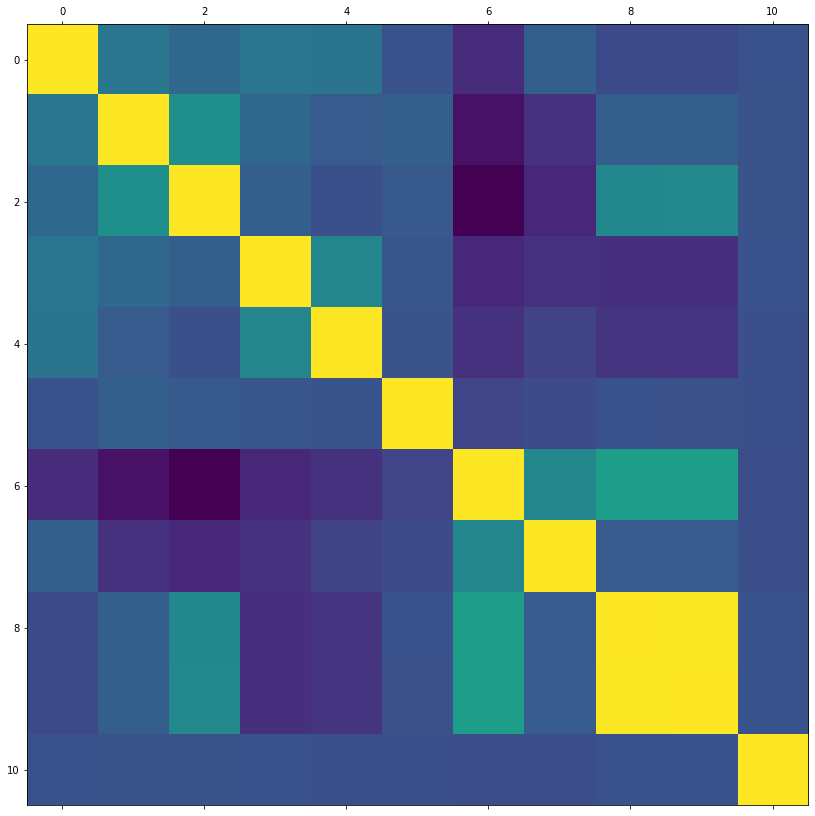

In [678]:
#Se imprimió la correlación entre factores y la suma de las ventas (Colar_sum)
plt.matshow(dfec.corr())
plt.show()

In [679]:
#Se corrió la correlación de todas las variables.
dfec.corr()

,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Colar_sum
Movilidad,1.000000,0.193503,0.113811,0.191211,0.183829,0.003193,-0.157946,0.072224,-0.032990,-0.030049,0.006014
NSE AB,0.193503,1.000000,0.332329,0.114564,0.051132,0.074584,-0.262917,-0.141395,0.070786,0.071176,0.013332
C+,0.113811,0.332329,1.000000,0.074599,-0.006650,0.042465,-0.329265,-0.175277,0.290678,0.294450,0.008942
Servicios públicos y comercio al por mayor,0.191211,0.114564,0.074599,1.000000,0.276215,0.024626,-0.177275,-0.141378,-0.143965,-0.142667,0.006922
Comercio por menor,0.183829,0.051132,-0.006650,0.276215,1.000000,0.009751,-0.137637,-0.057853,-0.128779,-0.131042,-0.002335
Centro Recreativo,0.003193,0.074584,0.042465,0.024626,0.009751,1.000000,-0.051896,-0.018119,0.003601,0.001122,-0.003545
NSE D,-0.157946,-0.262917,-0.329265,-0.177275,-0.137637,-0.051896,1.000000,0.285607,0.408159,0.412692,-0.008050
NSE E,0.072224,-0.141395,-0.175277,-0.141378,-0.057853,-0.018119,0.285607,1.000000,0.053679,0.050754,-0.007808
0 - 17 hombres,-0.032990,0.070786,0.290678,-0.143965,-0.128779,0.003601,0.408159,0.053679,1.000000,0.994084,0.004446
0 -17 mujeres,-0.030049,0.071176,0.294450,-0.142667,-0.131042,0.001122,0.412692,0.050754,0.994084,1.000000,0.004347


In [680]:
#Se agregó un índice a la table.
dfec = dfec.reset_index()

# Gráficas

In [681]:
#Se importaron las librerías necesarias para trabajar con arrays y graficar.
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
import statsmodels.api as sm

In [682]:
#Se imprimieron las primeras 5 filas del dataset.
dfec.head()

,index,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Centro Nocturno,Centro Cultural,VinosYLicores,Colar_sum
0,0,0.158419,0.0,0.085435,0.02,0.04,0.0,0.174913,0.060204,0.235525,0.240037,0.0,0.0,1.0,802.0
1,1,0.111784,0.0,0.259561,0.02,0.02,0.0,0.088647,0.000000,0.331552,0.332834,0.0,0.0,0.0,883.0
2,2,0.160911,0.0,0.145443,0.00,0.00,0.0,0.076096,0.000000,0.245502,0.241721,0.0,0.0,1.0,448.0
3,3,0.125311,0.0,0.218165,0.00,0.00,0.0,0.111728,0.000000,0.247818,0.263424,0.0,0.0,1.0,1104.0
4,4,0.200427,0.0,0.044447,0.03,0.00,0.0,0.053376,0.000000,0.193658,0.176614,0.0,0.0,0.0,580.0


In [683]:
#Se obtuvo el índice del dataset limpio para poder trabajar.
dfec.columns

Index(['index', 'Movilidad', 'NSE AB', 'C+',
       'Servicios públicos y comercio al por mayor', 'Comercio por menor',
       'Centro Recreativo', 'NSE D', 'NSE E', '0 - 17 hombres',
       '0 -17 mujeres', 'Centro Nocturno', 'Centro Cultural', 'VinosYLicores',
       'Colar_sum'],
      dtype='object')

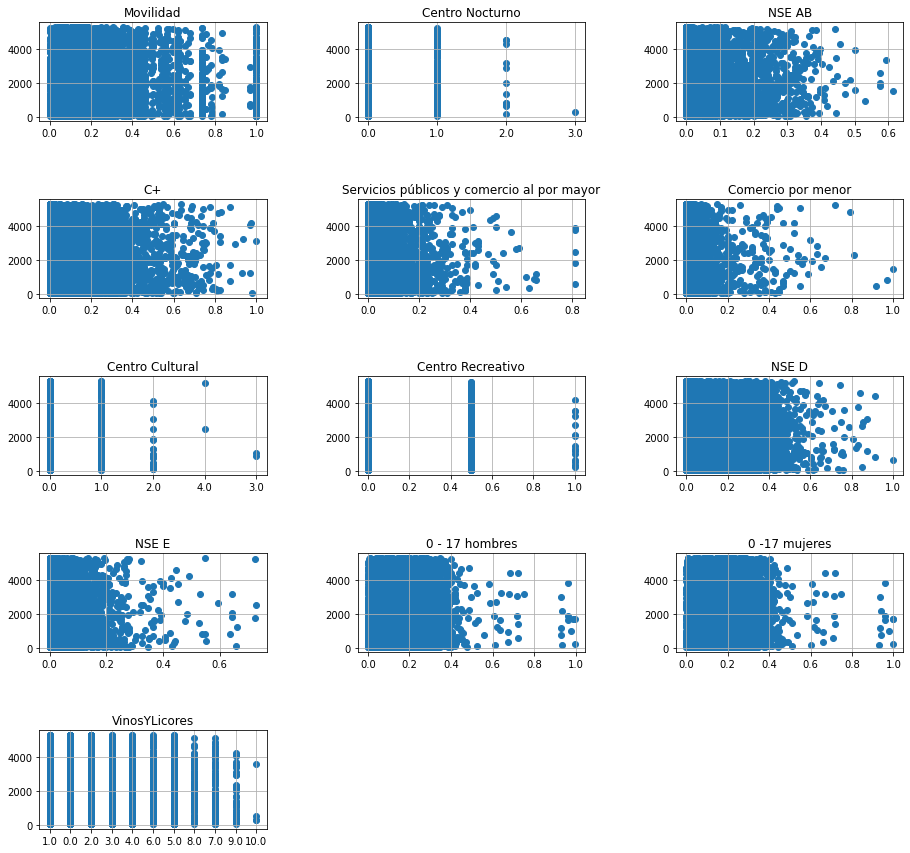

In [684]:
#Se corrieron scatter plots para ver la distribución de los datos de cada variable x.
plt.rcParams["figure.figsize"] = (15,14
) 

plt.subplot(5,3,1)
plt.scatter(dfec['Movilidad'], dfec['Colar_sum'])
plt.title("Movilidad")
plt.grid()

plt.subplot(5,3,2)
plt.scatter(dfec['Centro Nocturno'], dfec['Colar_sum'])
plt.title("Centro Nocturno")
plt.grid()

plt.subplot(5,3,3)
plt.scatter(dfec['NSE AB'], dfec['Colar_sum'])
plt.title("NSE AB")
plt.grid()

plt.subplot(5,3,4)
plt.scatter(dfec['C+'], dfec['Colar_sum'])
plt.title("C+")
plt.grid()

plt.subplot(5,3,5)
plt.scatter(dfec['Servicios públicos y comercio al por mayor'], dfec['Colar_sum'])
plt.title("Servicios públicos y comercio al por mayor")
plt.grid()

plt.subplot(5,3,6)
plt.scatter(dfec['Comercio por menor'], dfec['Colar_sum'])
plt.title("Comercio por menor")
plt.grid()

plt.subplot(5,3,7)
plt.scatter(dfec['Centro Cultural'], dfec['Colar_sum'])
plt.title("Centro Cultural")
plt.grid()

plt.subplot(5,3,8)
plt.scatter(dfec['Centro Recreativo'], dfec['Colar_sum'])
plt.title("Centro Recreativo")
plt.grid()

plt.subplot(5,3,9)
plt.scatter(dfec['NSE D'], dfec['Colar_sum'])
plt.title("NSE D")
plt.grid()

plt.subplot(5,3,10)
plt.scatter(dfec['NSE E'], dfec['Colar_sum'])
plt.title("NSE E")
plt.grid()

plt.subplot(5,3,11)
plt.scatter(dfec['0 - 17 hombres'], dfec['Colar_sum'])
plt.title("0 - 17 hombres")
plt.grid()

plt.subplot(5,3,12)
plt.scatter(dfec['0 -17 mujeres'], dfec['Colar_sum'])
plt.title("0 -17 mujeres")
plt.grid()

plt.subplot(5,3,13)
plt.scatter(dfec['VinosYLicores'], dfec['Colar_sum'])
plt.title("VinosYLicores")
plt.grid()

plt.subplots_adjust(left=0.1,
                    bottom=0.1,
                    right=0.9,
                    top=0.9,
                    wspace=0.4,
                    hspace=0.8)

In [685]:
#Se obtuvieron los datos estadísticos de los datos.
dfec.describe()

,index,Movilidad,NSE AB,C+,Servicios públicos y comercio al por mayor,Comercio por menor,Centro Recreativo,NSE D,NSE E,0 - 17 hombres,0 -17 mujeres,Colar_sum
count,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000,13378.000000
mean,15924.329571,0.161866,0.020539,0.071761,0.029737,0.013643,0.007961,0.107887,0.021355,0.163222,0.166864,2123.136642
std,9302.111212,0.150755,0.057526,0.125774,0.052531,0.048355,0.066918,0.123259,0.048585,0.090090,0.092267,1456.276255
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67.000000
25%,7827.500000,0.071200,0.000000,0.000000,0.000000,0.000000,0.000000,0.009810,0.000000,0.097096,0.098410,840.000000
50%,15763.500000,0.119616,0.000000,0.010883,0.020000,0.000000,0.000000,0.065205,0.000000,0.163371,0.166698,1929.000000
75%,24043.750000,0.200427,0.005618,0.090012,0.040000,0.000000,0.000000,0.167105,0.023263,0.220381,0.226941,3241.750000
max,32148.000000,1.000000,0.614017,1.000000,0.810000,1.000000,1.000000,1.000000,0.730132,0.995902,0.998129,5290.000000


In [686]:
dfec.shape

(13378, 15)

#Gráficas exploratorias

Para esta parte hicimos el mismo procedimiento pero con los datos después de haber eliminado outliers, quitado valores en cero y NaNs.

El scatter plot ya se corrió en la parte de gráficas, aquí sólo se corrió histogramas y boxplot.

In [687]:
import plotly.express as px

fig = px.histogram(dfec, x="Movilidad")
fig.show()

fig = px.histogram(dfec, x="Centro Nocturno")
fig.show()

fig = px.histogram(dfec, x="NSE AB")
fig.show()

fig = px.histogram(dfec, x="C+")
fig.show()

fig = px.histogram(dfec, x="Servicios públicos y comercio al por mayor")
fig.show()

fig = px.histogram(dfec, x="Comercio por menor")
fig.show()

fig = px.histogram(dfec, x="Centro Cultural")
fig.show()

fig = px.histogram(dfec, x="Centro Recreativo")
fig.show()

fig = px.histogram(dfec, x="NSE D")
fig.show()

fig = px.histogram(dfec, x="NSE E")
fig.show()

fig = px.histogram(dfec, x="0 - 17 hombres")
fig.show()

fig = px.histogram(dfec, x="0 -17 mujeres")
fig.show()

fig = px.histogram(dfec, x="VinosYLicores")
fig.show()

In [688]:
fig = px.box(dfec, x="Movilidad")
fig.show()

fig = px.box(dfec, x="Centro Nocturno")
fig.show()

fig = px.box(dfec, x="NSE AB")
fig.show()

fig = px.box(dfec, x="C+")
fig.show()

fig = px.box(dfec, x="Servicios públicos y comercio al por mayor")
fig.show()

fig = px.box(dfec, x="Comercio por menor")
fig.show()

fig = px.box(dfec, x="Centro Cultural")
fig.show()

fig = px.box(dfec, x="Centro Recreativo")
fig.show()

fig = px.box(dfec, x="NSE D")
fig.show()

fig = px.box(dfec, x="NSE E")
fig.show()

fig = px.box(dfec, x="0 - 17 hombres")
fig.show()

fig = px.box(dfec, x="0 -17 mujeres")
fig.show()

fig = px.box(dfec, x="VinosYLicores")
fig.show()

# Regresión Lineal

In [689]:
#Se importaron las librerías necesarias para empezar a trabajar con las regresiones lineales.
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from sklearn.metrics import r2_score

In [690]:
#Se eliminaron los espacios entre los nombres de las columnas, eliminas los puntos, cambia el signo + por plus y el 017 por nada, ya que este último valor se usa en dos columnas.
dfec.columns = dfec.columns.str.replace(' ', '')
dfec.columns = dfec.columns.str.replace('-', '')
dfec.columns = dfec.columns.str.replace('+', 'plus')
dfec.columns = dfec.columns.str.replace('017', '')

<ipython-input-690-bc49fdd6fbeb>:4: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [691]:
#Se imprimió la tabla con la modificación anterior.
dfec

,index,Movilidad,NSEAB,Cplus,Serviciospúblicosycomercioalpormayor,Comerciopormenor,CentroRecreativo,NSED,NSEE,hombres,mujeres,CentroNocturno,CentroCultural,VinosYLicores,Colar_sum
0,0,0.158419,0.000000,0.085435,0.02,0.04,0.0,0.174913,0.060204,0.235525,0.240037,0.0,0.0,1.0,802.0
1,1,0.111784,0.000000,0.259561,0.02,0.02,0.0,0.088647,0.000000,0.331552,0.332834,0.0,0.0,0.0,883.0
2,2,0.160911,0.000000,0.145443,0.00,0.00,0.0,0.076096,0.000000,0.245502,0.241721,0.0,0.0,1.0,448.0
3,3,0.125311,0.000000,0.218165,0.00,0.00,0.0,0.111728,0.000000,0.247818,0.263424,0.0,0.0,1.0,1104.0
4,4,0.200427,0.000000,0.044447,0.03,0.00,0.0,0.053376,0.000000,0.193658,0.176614,0.0,0.0,0.0,580.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13373,32141,0.247063,0.037484,0.241050,0.00,0.00,0.0,0.081362,0.000000,0.262783,0.267166,0.0,0.0,0.0,501.0
13374,32142,0.620506,0.000000,0.000000,0.00,0.00,0.0,0.000000,0.222644,0.049172,0.050327,0.0,0.0,4.0,119.0
13375,32146,0.156639,0.000000,0.000000,0.03,0.03,0.0,0.167989,0.000000,0.278995,0.301216,0.0,0.0,2.0,277.0
13376,32147,0.075116,0.000000,0.000000,0.00,0.00,0.0,0.083742,0.069389,0.069482,0.063798,0.0,0.0,0.0,86.0


La pregunta del Challenge 1 es: **¿Qué datos de entorno mueven las ventas de Coca-Cola?**

Por esta razón se están corriendo las regresiones con sus respectivas reiteraciones.

In [692]:
#Se corrió la regresión lineal con todas las variables para ver cuál tenían más relación con las ventas.
lm = sm.OLS.from_formula(formula = 'Colar_sum ~ Movilidad + CentroNocturno + NSEAB + Cplus + Serviciospúblicosycomercioalpormayor + Comerciopormenor + CentroCultural + CentroRecreativo + NSED + NSEE + hombres + mujeres + VinosYLicores',
            data=dfec
            ).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              Colar_sum   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.9572
Date:                Tue, 28 Mar 2023   Prob (F-statistic):              0.527
Time:                        01:22:24   Log-Likelihood:            -1.1641e+05
No. Observations:               13378   AIC:                         2.329e+05
Df Residuals:                   13350   BIC:                         2.331e+05
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [693]:
#Se seleccionaron variables que tienen mayor efecto sobre nuestra Y.
#Se buscaron Coef altos y P>|t| que sean menores a 0.05.
#Se eliminó: Movilidad, Cplus, CentroRecreativo, NSED, , mujeres.
lm = sm.OLS.from_formula(formula = 'Colar_sum ~ CentroNocturno + NSEAB + Serviciospúblicosycomercioalpormayor + Comerciopormenor + CentroCultural + NSEE + hombres + VinosYLicores',
            data=dfec
            ).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              Colar_sum   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.136
Date:                Tue, 28 Mar 2023   Prob (F-statistic):              0.297
Time:                        01:22:24   Log-Likelihood:            -1.1641e+05
No. Observations:               13378   AIC:                         2.329e+05
Df Residuals:                   13355   BIC:                         2.330e+05
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [694]:
#Se eliminó la variable hombres.
lm = sm.OLS.from_formula(formula = 'Colar_sum ~ CentroNocturno + NSEAB + Serviciospúblicosycomercioalpormayor + Comerciopormenor + CentroCultural + NSEE + VinosYLicores',
            data=dfec
            ).fit()
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:              Colar_sum   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.179
Date:                Tue, 28 Mar 2023   Prob (F-statistic):              0.258
Time:                        01:22:25   Log-Likelihood:            -1.1641e+05
No. Observations:               13378   AIC:                         2.329e+05
Df Residuals:                   13356   BIC:                         2.330e+05
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [695]:
#Esta función te da los coeficientes de las Xs.
#Sólo se está parametrizando con esta función.
lm.params

Intercept                               2127.221433
CentroNocturno[T.1.0]                    -62.787477
CentroNocturno[T.2.0]                     48.234558
CentroNocturno[T.3.0]                  -1836.814730
CentroCultural[T.1.0]                    -11.027774
CentroCultural[T.2.0]                   -793.481545
CentroCultural[T.3.0]                  -1132.577768
CentroCultural[T.4.0]                   1697.673828
VinosYLicores[T.1.0]                      10.066731
VinosYLicores[T.10.0]                   -944.082149
VinosYLicores[T.2.0]                     -58.173980
VinosYLicores[T.3.0]                     -35.370235
VinosYLicores[T.4.0]                     -79.378607
VinosYLicores[T.5.0]                      56.509337
VinosYLicores[T.6.0]                     137.411194
VinosYLicores[T.7.0]                     -67.840561
VinosYLicores[T.8.0]                     -11.278936
VinosYLicores[T.9.0]                    -247.525018
NSEAB                                    317.720685
Serviciospúb

In [696]:
#Se imprimió el modelo lineal...
print("The linear model is \n Colar_Avarage = ", lm.params[0], " + ", lm.params[1], "* CentroNocturno[1.0] + ", lm.params[2], "* CentroNocturno[2.0] + ", lm.params[3], "* CentroNocturno[3.0] +\n", lm.params[4], "* CentroCultural[1.0] + ", lm.params[5], "* CentroCultural[2.0] + ", lm.params[6], "* CentroCultural[3.0] + ", lm.params[7], "* CentroCultural[4.0] + \n", lm.params[8], "* VinosYLicores[1.0] + ",  lm.params[9], "* VinosYLicores[10.0] + ", lm.params[10], "* VinosYLicores[2.0] + ", lm.params[11], "* VinosYLicores[3.0] + \n", lm.params[12], "* VinosYLicores[4.0] + ", lm.params[13], "* VinosYLicores[5.0] + ",  lm.params[14], "* VinosYLicores[6.0] + ", lm.params[15], "* VinosYLicores[7.0] + \n", lm.params[16], "* VinosYLicores[8.0] + ", lm.params[17], "* VinosYLicores[9.0] + ", lm.params[18], "* NSEAB + ", lm.params[19], "* Serviciospúblicosycomercioalpormayor + \n", lm.params[20], "* Comerciopormenor + ", lm.params[21], "* NSEE")

The linear model is 
 Colar_Avarage =  2127.2214333783404  +  -62.78747709497304 * CentroNocturno[1.0] +  48.23455792070864 * CentroNocturno[2.0] +  -1836.814729763158 * CentroNocturno[3.0] +
 -11.027774454614562 * CentroCultural[1.0] +  -793.4815450140024 * CentroCultural[2.0] +  -1132.5777681385441 * CentroCultural[3.0] +  1697.6738275163593 * CentroCultural[4.0] + 
 10.066731179125426 * VinosYLicores[1.0] +  -944.08214874535 * VinosYLicores[10.0] +  -58.173980126547534 * VinosYLicores[2.0] +  -35.370234874396004 * VinosYLicores[3.0] + 
 -79.37860660848331 * VinosYLicores[4.0] +  56.5093369611943 * VinosYLicores[5.0] +  137.41119425240063 * VinosYLicores[6.0] +  -67.84056067438496 * VinosYLicores[7.0] + 
 -11.27893625472901 * VinosYLicores[8.0] +  -247.52501799435987 * VinosYLicores[9.0] +  317.7206848670867 * NSEAB +  167.5657945729509 * Serviciospúblicosycomercioalpormayor + 
 -140.3305692685436 * Comerciopormenor +  -166.9569408405028 * NSEE


In [697]:
#Asignamos los valores de los coeficientes a nuestras variables categoricas para posteriormente incluirlas a la base
SumCentroNocturno = []
for row in dfec['CentroNocturno']:
  if   row == '1.0': SumCentroNocturno.append(lm.params[1])
  elif row == '2.0': SumCentroNocturno.append(lm.params[2])
  elif row == '3.0': SumCentroNocturno.append(lm.params[3])
  else: SumCentroNocturno.append(0)

dfec['SumCentroNocturno'] = pd.DataFrame(SumCentroNocturno)

In [698]:
SumCentroCultural = []
for row in dfec['CentroCultural']:
  if   row == '1.0':  SumCentroCultural.append(lm.params[4])
  elif row == '2.0':  SumCentroCultural.append(lm.params[5])
  elif row == '3.0':  SumCentroCultural.append(lm.params[6])
  elif row == '4.0':  SumCentroCultural.append(lm.params[7])
  else: SumCentroCultural.append(0)

dfec['SumCentroCultural'] = pd.DataFrame(SumCentroCultural)

In [699]:
SumVinosYLicores = []
for row in dfec['VinosYLicores']:
  if   row == '1.0':  SumVinosYLicores.append(lm.params[8])
  elif row =='10.0':  SumVinosYLicores.append(lm.params[9])
  elif row == '2.0':  SumVinosYLicores.append(lm.params[10])
  elif row == '3.0':  SumVinosYLicores.append(lm.params[11])
  elif row == '4.0':  SumVinosYLicores.append(lm.params[12])
  elif row == '5.0':  SumVinosYLicores.append(lm.params[13])
  elif row == '6.0':  SumVinosYLicores.append(lm.params[14])
  elif row == '7.0':  SumVinosYLicores.append(lm.params[15])
  elif row == '8.0':  SumVinosYLicores.append(lm.params[16])
  elif row == '9.0':  SumVinosYLicores.append(lm.params[17])
  else: SumVinosYLicores.append(0)

dfec['SumVinosYLicores'] = pd.DataFrame(SumVinosYLicores)

In [700]:
#Se agregaron las iteraciones en la Y estimada.
dfec['Yest'] = lm.params[0] + lm.params[18]*dfec['NSEAB'] + lm.params[19]*dfec['Serviciospúblicosycomercioalpormayor'] + lm.params[20]*dfec['Comerciopormenor'] + lm.params[21]*dfec['NSEE'] + dfec['SumCentroNocturno'] + dfec['SumCentroCultural'] + dfec['SumVinosYLicores']
dfec['resid'] = dfec['Yest'] - dfec['Colar_sum']
dfec

,index,Movilidad,NSEAB,Cplus,Serviciospúblicosycomercioalpormayor,Comerciopormenor,CentroRecreativo,NSED,NSEE,hombres,mujeres,CentroNocturno,CentroCultural,VinosYLicores,Colar_sum,SumCentroNocturno,SumCentroCultural,SumVinosYLicores,Yest,resid
0,0,0.158419,0.000000,0.085435,0.02,0.04,0.0,0.174913,0.060204,0.235525,0.240037,0.0,0.0,1.0,802.0,0.0,0.0,10.066731,2124.974836,1322.974836
1,1,0.111784,0.000000,0.259561,0.02,0.02,0.0,0.088647,0.000000,0.331552,0.332834,0.0,0.0,0.0,883.0,0.0,0.0,0.000000,2127.766138,1244.766138
2,2,0.160911,0.000000,0.145443,0.00,0.00,0.0,0.076096,0.000000,0.245502,0.241721,0.0,0.0,1.0,448.0,0.0,0.0,10.066731,2137.288165,1689.288165
3,3,0.125311,0.000000,0.218165,0.00,0.00,0.0,0.111728,0.000000,0.247818,0.263424,0.0,0.0,1.0,1104.0,0.0,0.0,10.066731,2137.288165,1033.288165
4,4,0.200427,0.000000,0.044447,0.03,0.00,0.0,0.053376,0.000000,0.193658,0.176614,0.0,0.0,0.0,580.0,0.0,0.0,0.000000,2132.248407,1552.248407
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13373,32141,0.247063,0.037484,0.241050,0.00,0.00,0.0,0.081362,0.000000,0.262783,0.267166,0.0,0.0,0.0,501.0,0.0,0.0,0.000000,2139.130838,1638.130838
13374,32142,0.620506,0.000000,0.000000,0.00,0.00,0.0,0.000000,0.222644,0.049172,0.050327,0.0,0.0,4.0,119.0,0.0,0.0,-79.378607,2010.670904,1891.670904
13375,32146,0.156639,0.000000,0.000000,0.03,0.03,0.0,0.167989,0.000000,0.278995,0.301216,0.0,0.0,2.0,277.0,0.0,0.0,-58.173980,2069.864510,1792.864510
13376,32147,0.075116,0.000000,0.000000,0.00,0.00,0.0,0.083742,0.069389,0.069482,0.063798,0.0,0.0,0.0,86.0,0.0,0.0,0.000000,2115.636462,2029.636462


In [701]:
#Se calculó la media de los residuales.
dfec['resid'].mean()

-8.941302375330805e-13

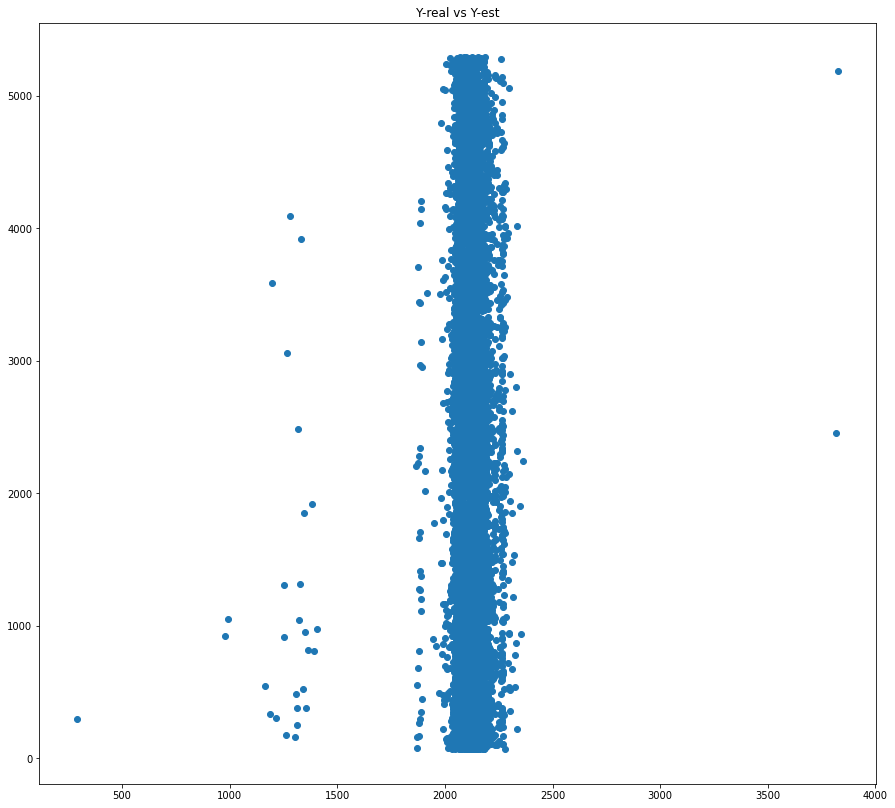

In [702]:
#Se graficó la Y estimada de las ventas contras la suma de las ventas reales del 2020.
#Se ve que la distribución va de 2000 al 2500.
plt.scatter(dfec['Yest'], dfec['Colar_sum'])
plt.title("Y-real vs Y-est")
plt.show()

(array([1.000e+00, 2.000e+00, 2.000e+01, 5.000e+00, 7.780e+02, 1.257e+04,
        0.000e+00, 0.000e+00, 0.000e+00, 2.000e+00]),
 array([ 293.        ,  646.41885149,  999.83770297, 1353.25655446,
        1706.67540594, 2060.09425743, 2413.51310891, 2766.9319604 ,
        3120.35081188, 3473.76966337, 3827.18851485]),
 <BarContainer object of 10 artists>)

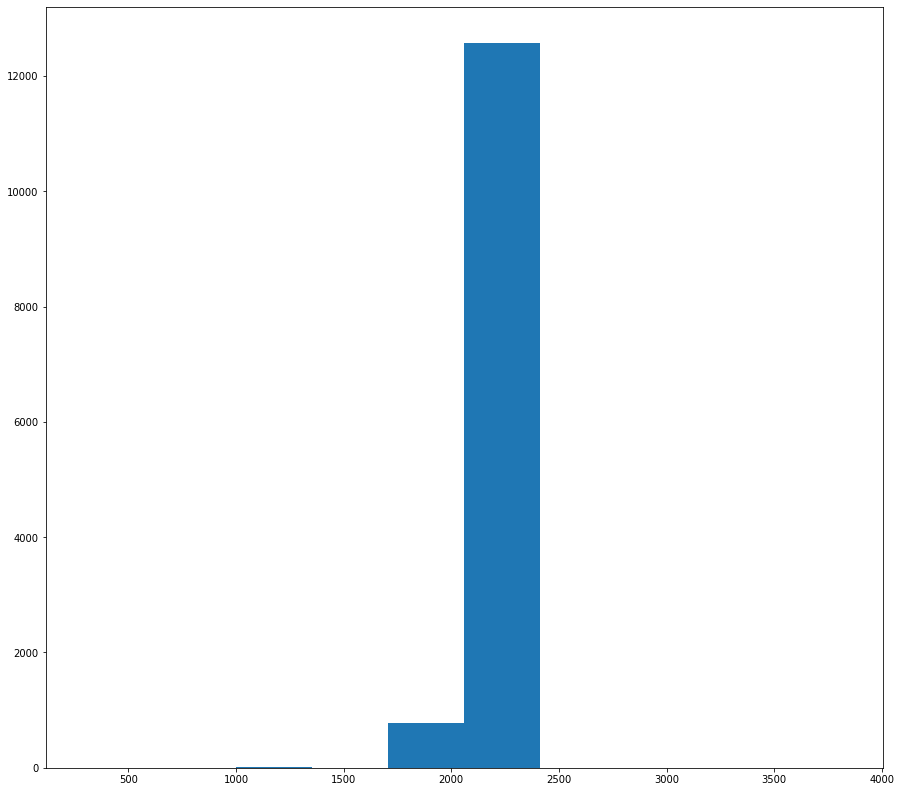

In [703]:
#Se hizo un histograma de la Y estimada y vemos que los valores tienen una distribución lineal que va del 1800 al 2400.
plt.hist(dfec['Yest'])

(array([2449., 1848., 1571., 1426., 1412., 1243., 1083.,  898.,  780.,
         668.]),
 array([  67. ,  589.3, 1111.6, 1633.9, 2156.2, 2678.5, 3200.8, 3723.1,
        4245.4, 4767.7, 5290. ]),
 <BarContainer object of 10 artists>)

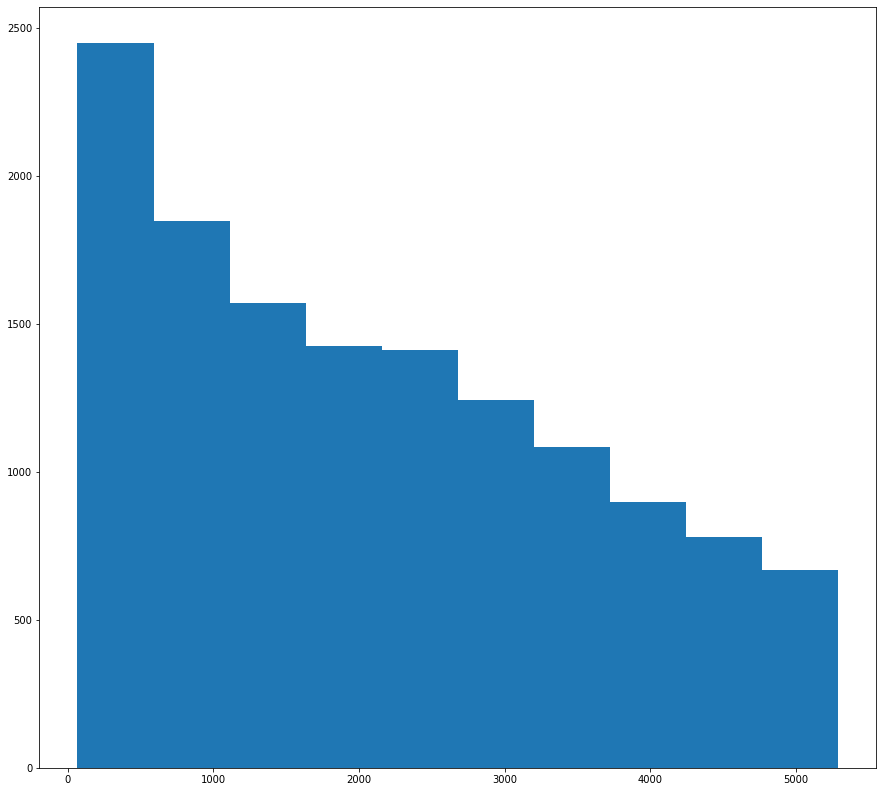

In [704]:
#Se hicieron los mismos gráficos pero ahora con los valores estimados y vemos que en este caso los valores van del 0 al 5000.
plt.hist(dfec['Colar_sum'])

# Conclusiones

**Conclusiones específicas**
1. Se llevó a cabo un modelo de regresión lineal, sin embargo, se evidenció que no hay factor estadísticamente acertado para determinar que dicha regresión lineal es el mejor modelo para estimar el valor de ventas.
2. A través de la regresión lineal, se evidencia:
  * Que cuando hay 3 centros nocturnos a 300 metros del cliente hay menor probabilidad de que se venda la Cola regular familiar no retornable ya que el coeficiente es igual a -1836.81
  * Que cuando hay 3 centros culturales a 300 metros del cliente hay menor probabilidad de que se venda la Cola regular familiar no retornable ya que el coeficiente es igual a -1132.57
  * Que cuando hay 10 tiendas de vinos y licores a 300 metros del cliente hay menor probabilidad de que se venda la Cola regular familiar no retornable ya que el coeficiente es igual a -944.08
  * Que cuando hay 4 centros culturales a 300 metros del cliente hay mayor probabilidad de que se venda la Cola regular familiar no retornable ya que el coeficiente es igual a 1697.67
  * Que la población por nivel socieconómico (AB) tiene  mayor probabilidad de comprar la Cola regular familiar no retornable ya que el coeficiente es igual a 317.72

**Conclusión general:**
Incluso después de la exploración y limpieza de los datos vemos que no hay relación estadística alguna entre los datos de entorno y las ventas pero si vemos que las variables que más afectan a las ventas negativamente con base en el coeficiente son Centro Cultural, Centro Nocturno y VinosYLicores.






